In [ ]:
import pandas as pd
import numpy as np

In [ ]:
train = pd.read_csv('train_FD001.txt', sep=' ', header=None)
train.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN


In [ ]:
# dropping the redundant columns
train.drop(train.columns[[26,27]], axis=1, inplace=True)

In [ ]:
# assigning column names
columns = ['unit', 'time'] + ['op_1','op_2','op_3'] + [f'sensor_{i}' for i in range(1,22)]
train.columns = columns

In [ ]:
train.head()

,unit,time,op_1,op_2,op_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [ ]:
train.shape

(20631, 26)

In [ ]:
train.nunique()

,0
unit,100
time,362
op_1,158
op_2,13
op_3,1
sensor_1,1
sensor_2,310
sensor_3,3012
sensor_4,4051
sensor_5,1


In [ ]:
# generating the target variable for training
# here we will be calculating the remaining useful life (RUL) for each engine
train['RUL'] = train.groupby('unit')['time'].transform('max') - train['time']

In [ ]:
# dropping the columns with constant values that do no carry information about the state of the equipment
train.drop(columns=['op_3','sensor_1','sensor_5','sensor_10','sensor_16','sensor_18','sensor_19','sensor_6'], axis=1, inplace=True)

In [ ]:
train.head()

,unit,time,op_1,op_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21,RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

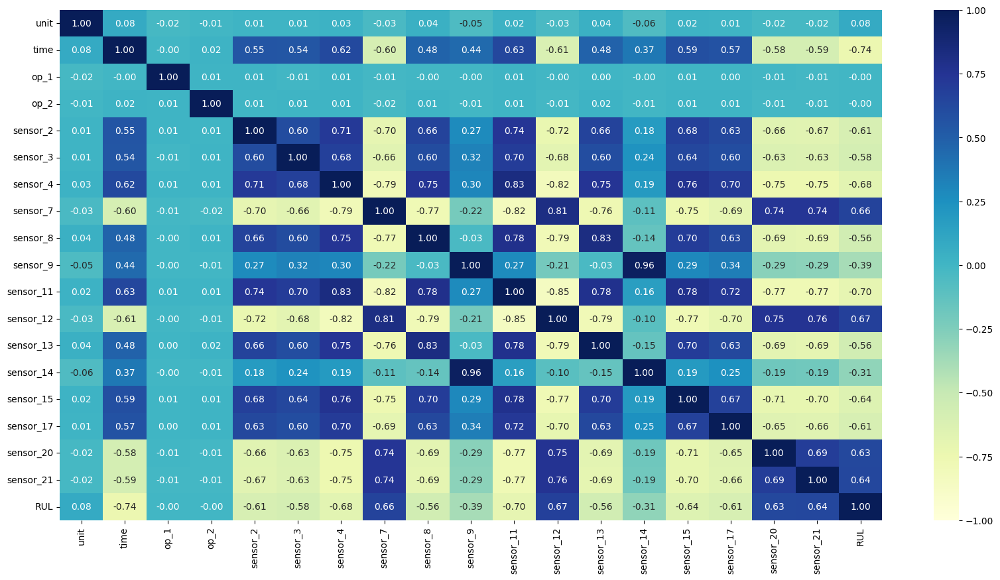

In [ ]:
# checking correlation of the features
plt.figure(figsize=(20,10))
sns.heatmap(train.corr(), vmin=-1, vmax=1, annot=True, cmap='YlGnBu', fmt='.2f')
plt.show();

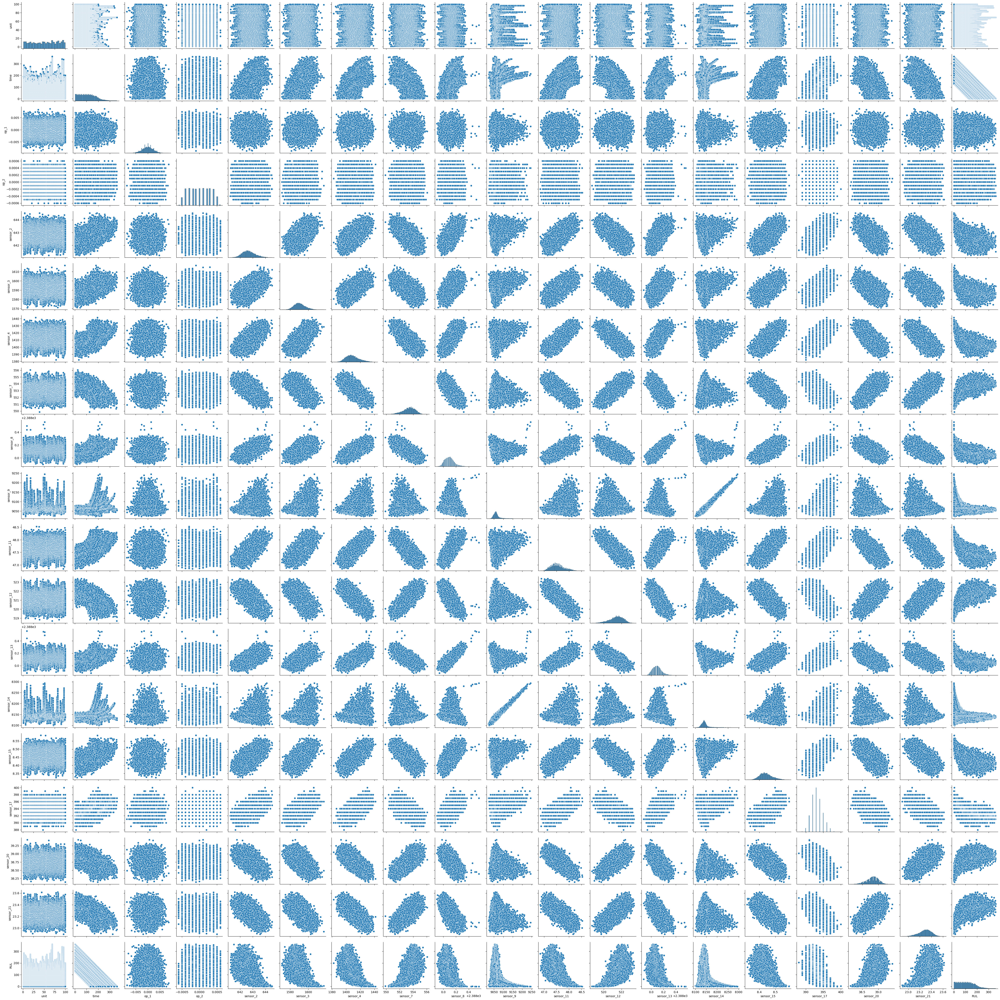

In [ ]:
sns.pairplot(data=train)
plt.show()

# Error function for competitive data

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import math

In [ ]:
# custom error function to evaluate the predictions of RUL
# This function is a custom assymetric scoring rule used to penalize overestimations and underestimations differently
# this is a common approach in real-world problems
# where the importance of predicting that the equipment will fail sooner than actual is higher than predicting that the equipment will last longer than its lifespan.
def score(actual_y, pred_y, a1 = 10, a2 = 13): # a1:scaling factor for under-prediction, a2:scaling factor for over-prediction
  actual_y = np.array(actual_y)
  pred_y = np.array(pred_y)

  #initializing the score
  score = 0

  d = pred_y - actual_y
  for i in d.flatten():
    if i >= 0:
      score += math.exp(i/a2) - 1 # penalty for overestimation
    else:
      score += math.exp(-i/a1) -1 # penalty for underestimation
  return score

In [ ]:
# defining a function for all the scoring metrics (including the custome one given above)
def pred_score(actual_y, pred_y):
  actual_y_arr = np.array(actual_y).flatten()
  pred_y_arr = np.array(pred_y).flatten()

  lst = [round(score(actual_y_arr, pred_y_arr),2), # custom scoring metric
         round(mean_absolute_error(actual_y_arr, pred_y_arr),2), # mean absolute error
         round(mean_squared_error(actual_y_arr,pred_y_arr),2)**0.5, # root mean squared error
         round(r2_score(actual_y_arr, pred_y_arr),2)] # Rsquared error
  print(f' Custom scoring metric {lst[0]}')
  print(f' mean absolute error {lst[1]}')
  print(f' root mean squared error {lst[2]}')
  print(f' R2 score {lst[3]}')
  return [lst[1], round(lst[2],2), lst[3]*100]

# Data Preprocessing for LSTM

In [ ]:
# preparing the dependent and the independent features
def prepare_data(train, n_steps, target_feature):
  x_lstm = [] # independent features empyty list
  y_lstm = [] # dependent features empty list
  for i in range(len(train) - n_steps):
    # step 1: creating the input sequence of the length 'n_steps' starting at row i
    seq_x = train.iloc[i:i+n_steps].drop(columns=[target_feature]).values

    # step 2: getting the target value ('RUL') right after the input sequence
    seq_y = train.iloc[i+n_steps][target_feature]

    # step 3: append the values to both the empty lists
    x_lstm.append(seq_x)
    y_lstm.append(seq_y)

  # step 4: converting the lists to numpy arrays
  return np.array(x_lstm), np.array(y_lstm)

In [ ]:
# scaling the data using MinMaxScaler()
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train.drop(columns=['unit','time','RUL'], axis=1))
train_scaled = pd.DataFrame(train_scaled, columns=(train.drop(columns=['unit','time','RUL'], axis=1).columns), index=train.index)
train = pd.concat([train_scaled, train[['unit','time','RUL']]], axis=1)

In [ ]:
train.head()

,op_1,op_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21,unit,time,RUL
0,0.459770,0.166667,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662,1,1,191
1,0.609195,0.250000,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,0.380952,0.765458,0.279412,0.162813,0.411312,0.333333,0.666667,0.731014,1,2,190
2,0.252874,0.750000,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,0.250000,0.795309,0.220588,0.171793,0.357445,0.166667,0.627907,0.621375,1,3,189
3,0.540230,0.500000,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,0.166667,0.889126,0.294118,0.174889,0.166603,0.333333,0.573643,0.662386,1,4,188
4,0.390805,0.333333,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,0.255952,0.746269,0.235294,0.174734,0.402078,0.416667,0.589147,0.704502,1,5,187


In [ ]:
# number of steps, and data preparation
n_steps = 30
x,y = prepare_data(train, n_steps, 'RUL')

In [ ]:
x.shape

(20601, 30, 18)

In [ ]:
y.shape

(20601,)

# Building the LSTM Model

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
# defining the LSTM model
model = Sequential([LSTM(50, activation='relu',return_sequences=True, input_shape=(n_steps,18)),
                    LSTM(50, activation='relu'),
                    Dense(1)])
model.compile(optimizer='adam',loss='mse') # compiling the model

#training the model
model.fit(x,y,epochs=25, verbose=1)
model.compile(optimizer='adam',loss='mse') # compiling the model

Epoch 1/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 18753.8145
Epoch 2/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 10586.2939
Epoch 3/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 6868.1455
Epoch 4/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6587.9214
Epoch 5/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5770.8887
Epoch 6/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5829.8765
Epoch 7/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5324.0117
Epoch 8/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5535.7764
Epoch 9/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 74960.6328
Epoch 10/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 7832.8203
Epoch 11/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 6620.3638
Epoch 12/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5868.9248
Epoch 13/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 5633.1821
Epoch 14/25
644/644 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 5472.3032
Epoch 15/25

In [ ]:
# Preparing the test data
# dropping the redundant columns
test = pd.read_csv('test_FD001.txt', sep=' ', header=None)
test.drop(columns=[26,27], axis=1, inplace=True)

In [ ]:
# assigning column names
test.columns = columns
test.head()

,unit,time,op_1,op_2,op_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [ ]:
# dropping the columns with constant values that do no carry information about the state of the equipment
test.drop(columns=['op_3','sensor_1','sensor_5','sensor_10','sensor_16','sensor_18','sensor_19','sensor_6'], axis=1, inplace=True)

In [ ]:
test.shape

(13096, 18)

In [ ]:
test.head()

,unit,time,op_1,op_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21
0,1,1,0.0023,0.0003,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,-0.0027,-0.0003,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,0.0003,0.0001,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,0.0042,0.0000,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,0.0014,0.0000,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


In [ ]:
test_scaled = scaler.transform(test.drop(columns=['unit','time'],axis=1))
test_scaled = pd.DataFrame(test_scaled, columns=(test.drop(columns=['unit','time'], axis=1).columns), index=test.index)
test = pd.concat([test_scaled, test[['unit','time']]], axis=1)

In [ ]:
test.head()

,op_1,op_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21,unit,time
0,0.632184,0.750000,0.545181,0.310661,0.269413,0.652174,0.212121,0.127614,0.208333,0.646055,0.220588,0.132160,0.308965,0.333333,0.558140,0.661834,1,1
1,0.344828,0.250000,0.150602,0.379551,0.222316,0.805153,0.166667,0.146684,0.386905,0.739872,0.264706,0.204768,0.213159,0.416667,0.682171,0.686827,1,2
2,0.517241,0.583333,0.376506,0.346632,0.322248,0.685990,0.227273,0.158081,0.386905,0.699360,0.220588,0.155640,0.458638,0.416667,0.728682,0.721348,1,3
3,0.741379,0.500000,0.370482,0.285154,0.408001,0.679549,0.196970,0.105717,0.255952,0.573561,0.250000,0.170090,0.257022,0.250000,0.666667,0.662110,1,4
4,0.580460,0.500000,0.391566,0.352082,0.332039,0.694042,0.166667,0.102396,0.273810,0.737740,0.220588,0.152751,0.300885,0.166667,0.658915,0.716377,1,5


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   op_1       13096 non-null  float64
 1   op_2       13096 non-null  float64
 2   sensor_2   13096 non-null  float64
 3   sensor_3   13096 non-null  float64
 4   sensor_4   13096 non-null  float64
 5   sensor_7   13096 non-null  float64
 6   sensor_8   13096 non-null  float64
 7   sensor_9   13096 non-null  float64
 8   sensor_11  13096 non-null  float64
 9   sensor_12  13096 non-null  float64
 10  sensor_13  13096 non-null  float64
 11  sensor_14  13096 non-null  float64
 12  sensor_15  13096 non-null  float64
 13  sensor_17  13096 non-null  float64
 14  sensor_20  13096 non-null  float64
 15  sensor_21  13096 non-null  float64
 16  unit       13096 non-null  int64  
 17  time       13096 non-null  int64  
dtypes: float64(16), int64(2)
memory usage: 1.8 MB


In [ ]:
# Set window size
window_size = 30

# Initialize sequence list
test_sequences = []

# Iterate over each engine (unit)
for uid in test['unit'].unique():
    unit_data = test[test['unit'] == uid]

    if len(unit_data) >= window_size:
        # Get the last 'window_size' time steps
        input_seq = unit_data.iloc[-window_size:]

        # Drop non-sensor columns and scale features
        input_seq_values = input_seq[test.columns].values

        # Append to list
        test_sequences.append(input_seq_values)

# Convert to 3D NumPy array for LSTM: (samples, timesteps, features)
X_test = np.array(test_sequences)

# Check the shape
print("Shape of LSTM-ready test data:", X_test.shape)

Shape of LSTM-ready test data: (100, 30, 18)


In [ ]:
pred_test = model.predict(X_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step


In [ ]:
# importing the actual RUL values
actual_RUL = pd.read_csv('RUL_FD001.txt', header=None, names=['RUL'])
actual_RUL.head()

,RUL
0,112
1,98
2,69
3,82
4,91


In [ ]:
pred_score(actual_RUL, pred_test)

 Custom scoring metric 146300703560689.97
 mean absolute error 94.8
 root mean squared error 130.13715841372903
 R2 score -8.81


[94.8, 130.14, -881.0]